# CS5489 - Machine Learning
# Lecture 8b - Non-Linear Dimensionality Reduction
### Dept. of Computer Science, City University of Hong Kong

# Outline
1. Linear Dimensionality Reduction for Vectors
2. Linear Dimensionality Reduction for Text
3. **Non-linear Dimensionality Reduction**
4. Manifold Embedding

In [1]:
# setup
%matplotlib inline
import matplotlib_inline   # setup output image format
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 100  # display larger images
import matplotlib
from numpy import *
from sklearn import *
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D

rbow = plt.get_cmap('rainbow')

# Linear Dimensionality Reduction
- PCA, NMF, LSA are all linear dimensionality reduction methods
  - model the data as "living" on a linear manifold (line, plane, etc).
<img src="imgs/pca.png" width="800px">

# Non-linear surface
- What if the data "lives" on a non-flat surface?

In [2]:
def plot_basis(X, vo, Xp=None, sp=None, showleg=True, Y=None, showcontours=False, pca=None, showlowarrow=True):
    if sp is None:
        sp = ((1,2,1), (1,2,2))
    cols = ['k','g']
    
    if Y is None:
        Y = zeros(len(X))
        mycmap = plt.get_cmap('bwr')
    else:
        mycmap = rbow
    
    # normalize v
    v = vo.copy()
    numd = v.shape[0]
    for j in range(numd):
        v[j,:] /= linalg.norm(v[j,:])
        # flip direction if necessary
        if all(v[j,:] < 0):
            v[j,:] *= -1.0
        
    Xm = mean(X,axis=0)         # get mean
    if Xp is None:
        Xp = dot(X-Xm,v.T) # project data onto v
    
    plt.subplot(sp[0][0], sp[0][1], sp[0][2])
    # plot points
    plt.scatter(X[:,0], X[:,1], s=5, edgecolors="none", c=Y, cmap=mycmap)

    plt.axis('equal'); plt.grid(True)
    plt.title('Original space (x)')
    
    tmp = plt.axis()
    hw = (tmp[1]-tmp[0])/30
    lw = hw/10
    
    mind = zeros(numd)
    maxd = zeros(numd)
    Ls = []
    LL = []
    for j in range(numd):
        mind[j] = Xp[:,j].min()
        maxd[j] = Xp[:,j].max()
        
        ofact = 0.9
        Xm2 = Xm + v[j]*maxd[j]*ofact
        Xm1 = Xm + v[j]*mind[j]*ofact
        vl = v[j]*(maxd[j]-mind[j])*ofact        

        tmp = plt.arrow(Xm1[0], Xm1[1], vl[0], vl[1], width=lw, head_width=hw, 
                        color=cols[j], length_includes_head=True)
        Ls.append(tmp)
        LL.append("PC " + str(j))

    plt.plot(Xm[0], Xm[1], 'ks')

    axbox = plt.axis()

    # plot contours
    if showcontours:
        xr = [linspace(axbox[0],axbox[1],200), 
              linspace(axbox[2],axbox[3],200)]
        xgrid0, xgrid1 = meshgrid(xr[0], xr[1])
        allpts = c_[xgrid0.ravel(), xgrid1.ravel()]

        Ypred = pca.transform(allpts).reshape(xgrid0.shape)
        
        L = 15
        # print(Ypred)
        # vm = max(abs(int(Ypred.max())), abs(int(Ypred.min())))
        vm = (lambda a,b: a if a>b else b)(abs(Ypred.max().item()), abs(Ypred.min().item()))

        # CS = plt.contourf(xr[0], xr[1], Ypred, L, linestyles='dashed', alpha=0.2, cmap=plt.get_cmap('bwr'), vmin=-vm, vmax=vm)
        CS = plt.contour(xr[0], xr[1], Ypred, L, linestyles='dashed', colors='k', linewidths=1)
        plt.clabel(CS, inline=1, fontsize=5)
        #plt.imshow(Ypred, origin='lower', extent=axbox, aspect='auto', a
        #        alpha=0.2, interpolation='nearest', cmap=mycmap)
    
    if showleg:
        tmp = plt.legend(Ls, LL, loc='lower right')
        tmp.get_frame().set_facecolor('white')
    
    plt.axis('auto')
    plt.axis(axbox); 
    
    plt.subplot(sp[1][0], sp[1][1], sp[1][2])
    if showlowarrow:
        plt.arrow(mind[0]*ofact, 0, (maxd[0]-mind[0])*ofact, 0, width=lw, head_width=hw, color=cols[0])
    if numd == 2:
        if showlowarrow:
            plt.arrow(0, mind[1]*ofact, 0, (maxd[1]-mind[1])*ofact, width=lw, head_width=hw, color=cols[1])        
        plt.scatter(Xp[:,0], Xp[:,1], s=10, marker='+', c=Y, cmap=mycmap)
        plt.xlabel('w1')
        plt.ylabel('w2')
    else:
        plt.scatter(Xp[:,0], zeros(len(Xp)), s=15, marker='+', c=Y, cmap=mycmap)
        plt.xlabel('w')

    plt.axis('equal'); plt.grid(True)
    plt.title('Low-dim space (w)')

In [3]:
random.seed(5230)

# polynomial manifold
tX = random.uniform(-6,6,size=(200,1))
#tY = 0.1*(tX-1)*(tX+5)*(tX-5)
tY = 0.2*tX**2
tY += random.normal(scale=0.5, size=(200,1))
Xpoly = c_[tX, tY]
Ypoly = tX

pfig = plt.figure()
plt.scatter(Xpoly[:,0], Xpoly[:,1], s=5, edgecolor="none")
plt.axis('equal')
plt.grid(True)
plt.close()
X = Xpoly
Y = Ypoly.ravel()

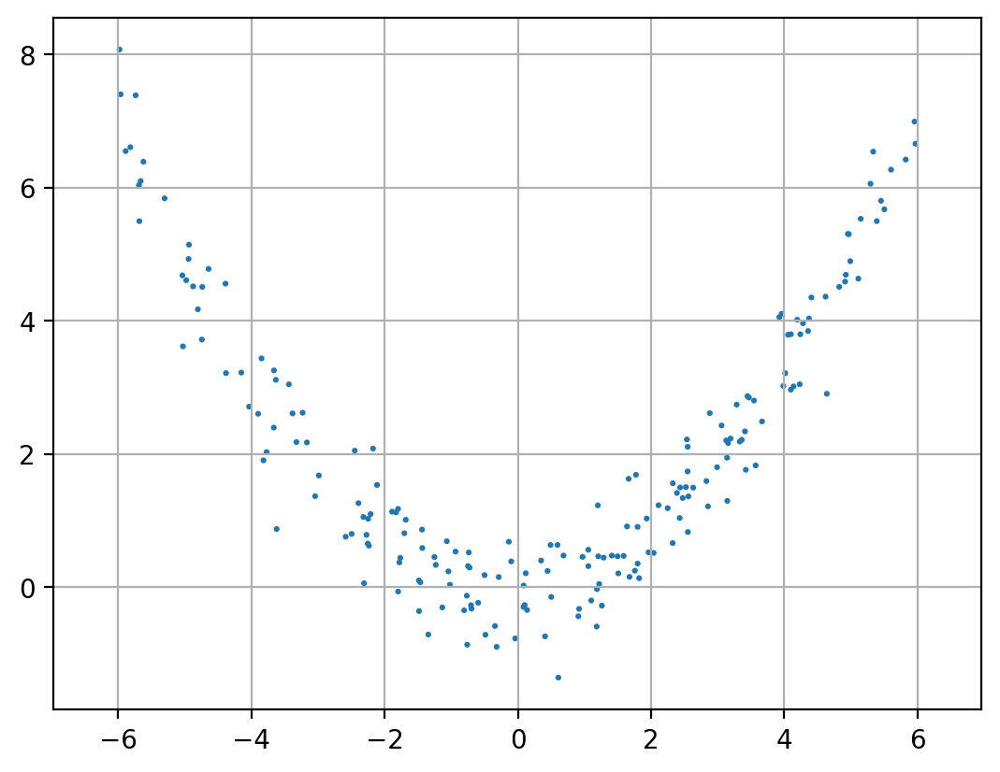

In [4]:
pfig

- PCA can't capture the curvature of the data
  - purple points are close together
  - red points are close together

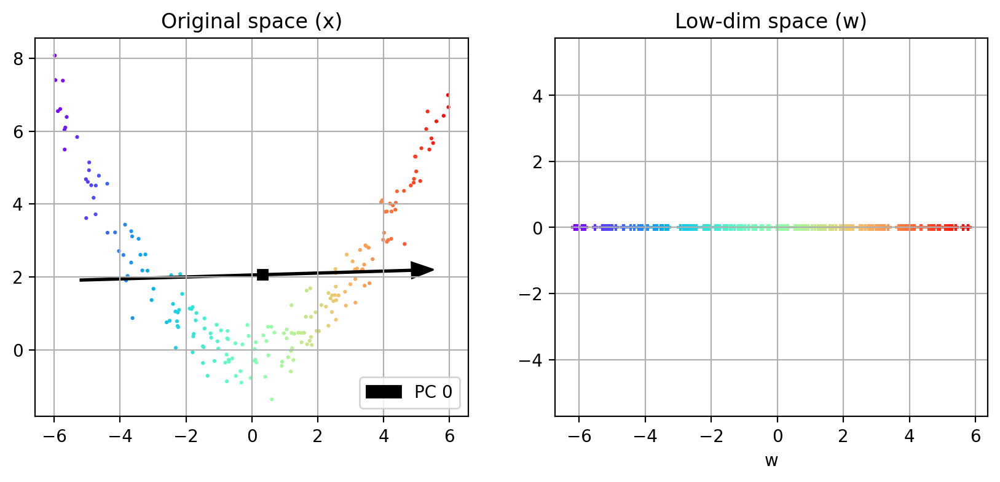

In [5]:
pca = decomposition.PCA(n_components=1)
W   = pca.fit_transform(X)

plt.figure(figsize=(10,4))
plot_basis(X, pca.components_, Y=Y, showlowarrow=False)

- iso-contours of PCA projection
  - points on the same dashed line are projected to the same PCA coefficient.

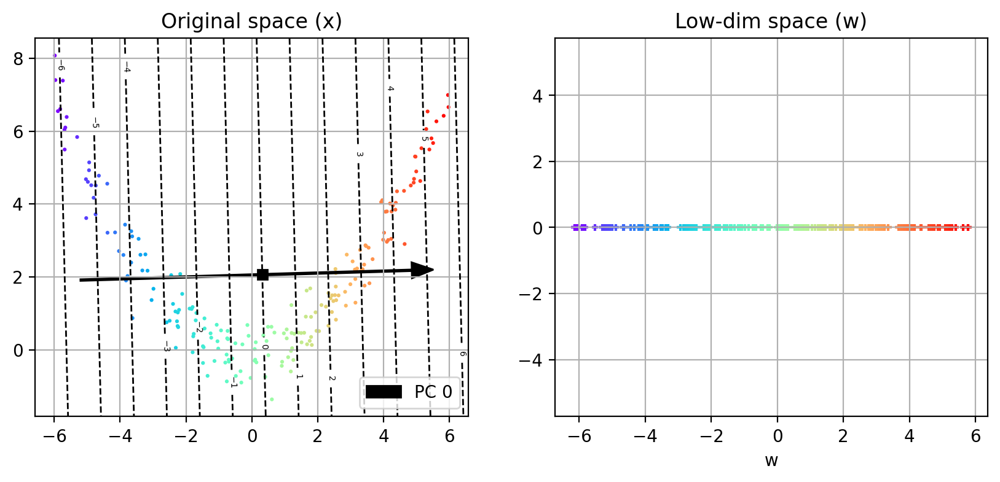

In [6]:
plt.figure(figsize=(10,4))
plot_basis(X, pca.components_, Y=Y, showcontours=True, pca=pca, showlowarrow=False)

# Kernel PCA
- _How to project to a non-linear surface?_
  - apply a high-dimensional feature transformation to the data
    - $\mathbf{x}_i \Rightarrow \phi(\mathbf{x}_i)$
  - project high-dim data to a linear surface
    - i.e. run PCA on $\phi(\mathbf{x}_i)$
  - in the original space, the projection will be non-linear
<img src="imgs/kpca.png" width=600>

# Kernel principal components
- a principal component $\mathbf{v}$ is a linear combination of high-dim vectors
  - $\mathbf{v} = \sum_{i=1}^n a_{i} \phi(\mathbf{x}_i)$
  - where $a_{i}$ are learned weights for component $\mathbf{v}$.
- For a new point $\mathbf{x}_*$, the KPCA coefficient for $\mathbf{v}$ is
  - $w = \phi(\mathbf{x}_*)^T\mathbf{v} = \sum_{i=1}^n a_{i}\phi(\mathbf{x}_*)^T \phi(\mathbf{x}_i) = \sum_{i=1}^n a_{i} k(\mathbf{x}_*, \mathbf{x}_i) = \mathbf{k}_*^T\mathbf{a}$
  - coefficient is based on similarity to data points belonging to $\mathbf{v}$.
  - using the kernel trick saves computation.


# Learning KPCA weights
- Apply PCA to the transformed data $\{\phi(\mathbf{x}_i)\}$:
- After some derivation:
  - 1) Calculate the kernel matrix $\mathbf{K} = [k(\mathbf{x}_i, \mathbf{x}_j)]_{ij}$
  - 2) center the kernel (remove the mean in the high-dim space: $\tilde{\mathbf{K}} = (\mathbf{I}-\tfrac{1}{N}\mathbf{1}\mathbf{1}^T)\mathbf{K}(\mathbf{I}-\tfrac{1}{N}\mathbf{1}\mathbf{1}^T)$
     - $\mathbf{1}\mathbf{1}^T$ is a matrix of ones.
  - 3) Find the top-K eigenvector/value pairs: $\tilde{\mathbf{K}} \mathbf{a}_j = \lambda_j\mathbf{a}_j$
  - 4) Scale (normalize PC in high-dim space): $\mathbf{a}_j \leftarrow \tfrac{1}{\sqrt{\lambda_j}}\mathbf{a}_j$
  - 5) Project new data $\mathbf{x}_*$: $w_j = \mathbf{k}_*^T\mathbf{a}_j$

In [7]:
def plot_kpca(X, W, kpca, showleg=True, Y=None, showcontours=False, showpcs=None, colorcoefs=False):
    cols = ['k','g']
    
    numd = W.shape[1]
    
        
    if Y is None:
        Y = zeros(len(X))
        mycmap = plt.get_cmap('bwr')
    else:
        mycmap = rbow
        
    if showpcs is None:
        showpcs = range(numd)

    if len(showpcs)==1:
        sx=2; sy=1
    elif len(showpcs)==2:
        if (numd<=2):
            sx=3; sy=1
        else: 
            sx=2; sy=1            
    else:
        sx=3; sy=int(ceil(len(showpcs)/3.))
        
    for i,d in enumerate(showpcs):        
        plt.subplot(sy, sx, i+1)
        # plot points
        if colorcoefs:
            myec = 'k'
            myc = W[:,d]
        else:
            myc = Y
            myec = 'none'
            
        plt.scatter(X[:,0], X[:,1], s=7, edgecolor=myec, c=myc, cmap=mycmap)
        
        plt.axis('equal'); plt.grid(True)
        plt.title('Original space (x) : PC ' + str(d+1))

        #tmp = plt.axis()
        #hw = (tmp[1]-tmp[0])/30
        #lw = hw/10

        # plot contours
        if showcontours:
            if i==0:
                axbox = plt.axis()
                xr = [linspace(axbox[0],axbox[1],200), 
                      linspace(axbox[2],axbox[3],200)]
                xgrid0, xgrid1 = meshgrid(xr[0], xr[1])
                allpts = c_[xgrid0.ravel(), xgrid1.ravel()]
                Wpred = kpca.transform(allpts)
            
            L = 15
            if numd>1:
                tmpW = Wpred[:,d].reshape(xgrid0.shape)
            else:
                tmpW = Wpred.reshape(xgrid0.shape)

            vm = (lambda a,b: a if a>b else b)(abs(tmpW.max()), abs(tmpW.min()))

            CS = plt.contourf(xr[0], xr[1], tmpW, L, linestyles='dashed', alpha=0.2, 
                              cmap=plt.get_cmap('bwr'), vmin=-vm, vmax=vm)
            CS = plt.contour(xr[0], xr[1], tmpW, L, linestyles='dashed', colors='k', linewidths=0.5)
            plt.axis('auto'); plt.axis(axbox)

        
    if (numd<=2):
        plt.subplot(sy, sx, i+2)
        #plt.arrow(mind[0]*ofact, 0, (maxd[0]-mind[0])*ofact, 0, width=lw, head_width=hw, color=cols[0])
        if numd == 2:
            #plt.arrow(0, mind[1]*ofact, 0, (maxd[1]-mind[1])*ofact, width=lw, head_width=hw, color=cols[1])        
            plt.scatter(W[:,0], W[:,1], s=10, marker='+', c=Y, cmap=mycmap)
            plt.xlabel('w1')
            plt.ylabel('w2')
        else:
            plt.scatter(W[:,0], zeros(len(W)), s=15, marker='+', c=Y, cmap=mycmap)
            plt.xlabel('w')

        plt.axis('equal'); plt.grid(True)
        plt.title('Low-dim space (w)')
    plt.tight_layout()

- Example using polynomial kernel
  - purple points are further apart.
  - PC coefficient corresponds to location along the data curve.

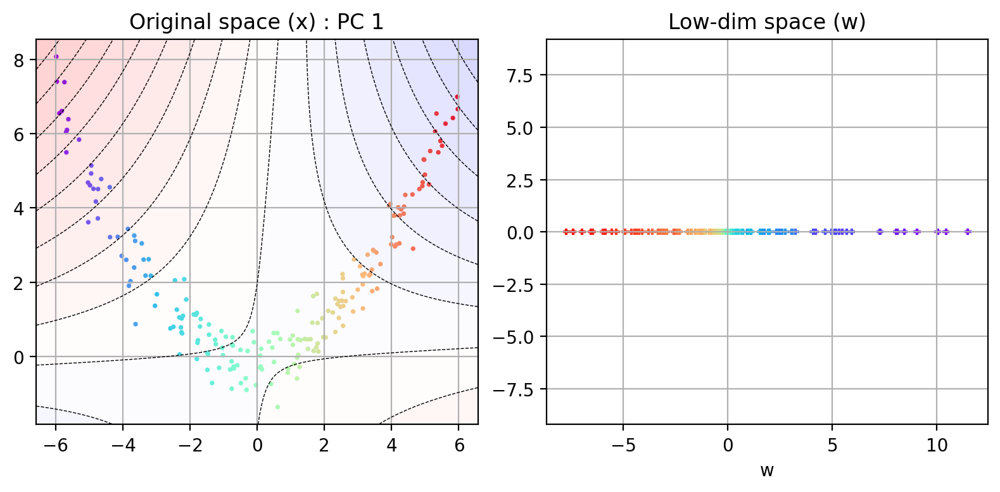

In [8]:
# run KPCA
kpca = decomposition.KernelPCA(n_components=1, kernel='poly', gamma=0.15, degree=2, coef0=0)
W = kpca.fit_transform(X)

plt.figure(figsize=(8,4))
plot_kpca(X, W, kpca, showcontours=True, Y=Y)

- Example: 2 PCs
  - 2nd PC corresponds to the distance from the center

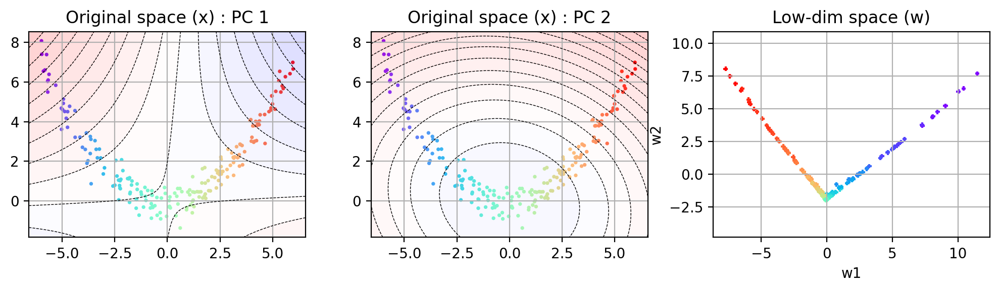

In [9]:
# run KPCA
kpca = decomposition.KernelPCA(n_components=2, kernel='poly', gamma=0.15, degree=2, coef0=0)
W = kpca.fit_transform(X)

plt.figure(figsize=(10,3))
plot_kpca(X, W, kpca, showcontours=True, Y=Y)

# RBF kernel
- principal components separate the data into clusters
- coefficient is distance to clusters

In [10]:
[Xblobs, Yblobs] = datasets.make_blobs(n_samples=200, n_features=2, cluster_std=1.0, 
                             centers=[[0,5],[-5,-5],[5,-3]], random_state=1234)
X = Xblobs
Y = Yblobs

# Example
- data with 3 clusters

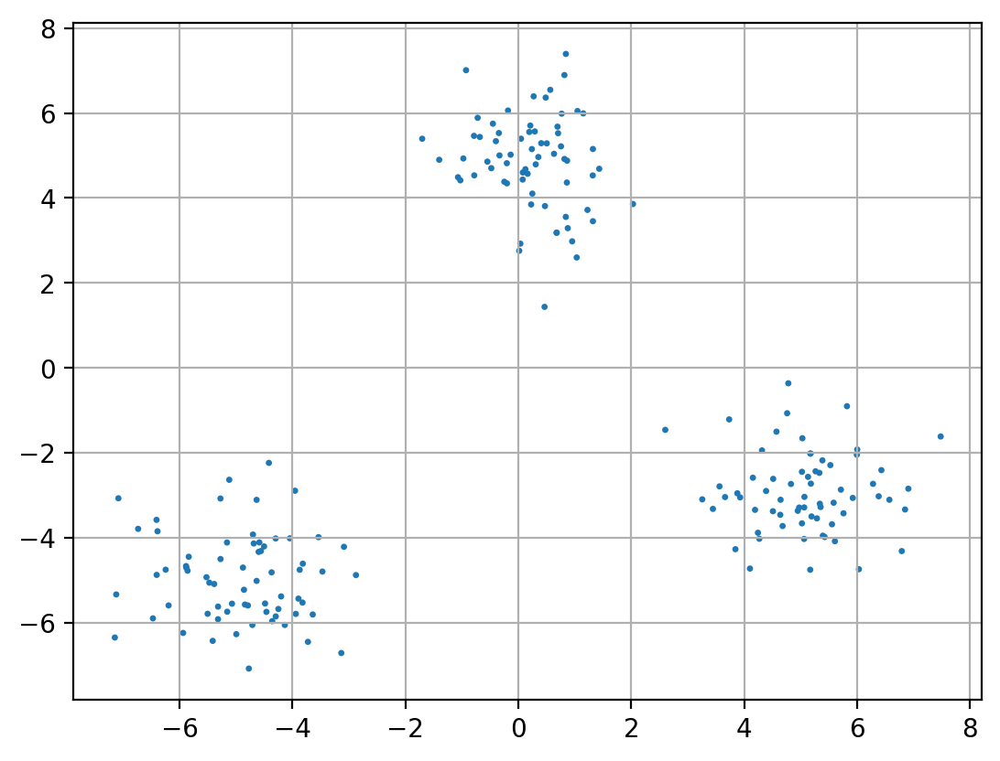

In [11]:
plt.scatter(X[:,0], X[:,1], s=6, edgecolor="none")
plt.grid(True);

- The first 2 PCs can split the data into 3 clusters
  - the color of the datapoint corresponds to the coefficient value.

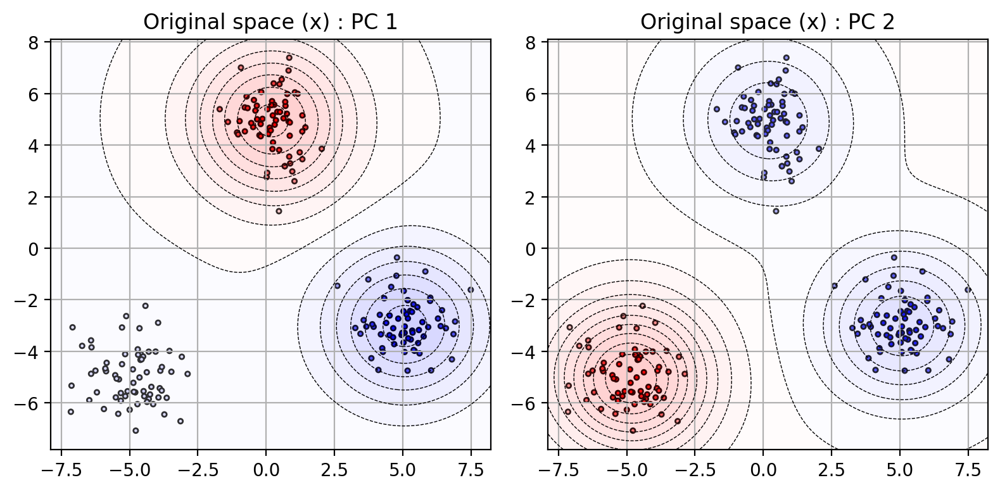

In [12]:
# run KPCA
kpca = decomposition.KernelPCA(n_components=8, kernel='rbf', gamma=0.15)
W = kpca.fit_transform(X)

plt.figure(figsize=(8,4))
plot_kpca(X, W, kpca, showcontours=True, showpcs=[0,1], colorcoefs=True)

- The remaining 6 PCs split each cluster into halves
  - multiple splits in orthogonal directions

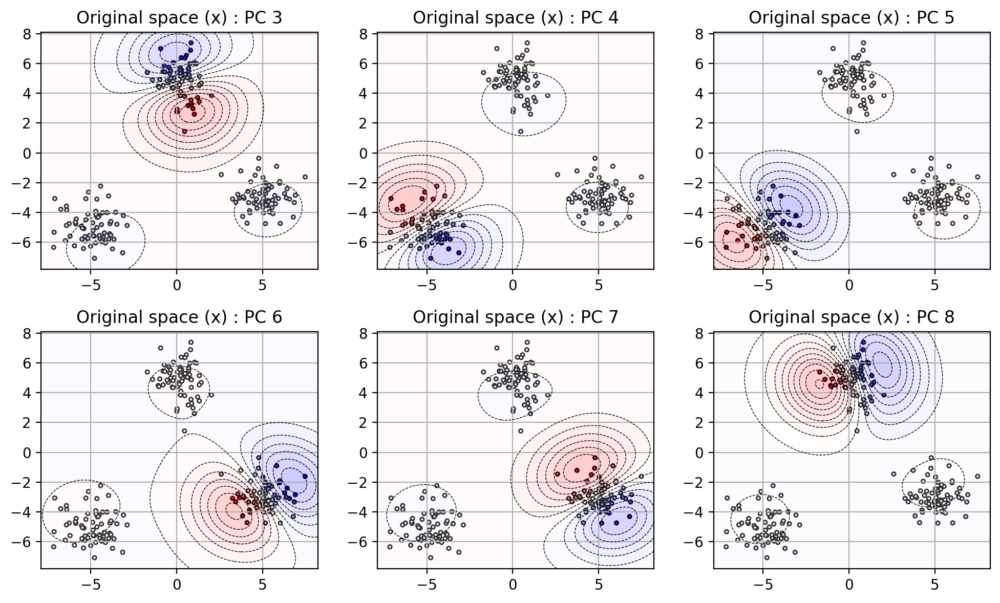

In [13]:
plt.figure(figsize=(10,6))
plot_kpca(X, W, kpca, showcontours=True, showpcs=range(2,8), colorcoefs=True)

# Example on digit images
- 8 x 8 images -> 64D vector

In [14]:
digits = datasets.load_digits(n_class=10)
X = digits.data
Y = digits.target

# randomly split data into training and testing
trainX, testX, trainY, testY = \
  model_selection.train_test_split(X, Y, 
  train_size=0.8, test_size=0.2, random_state=4487)

In [15]:
img = digits.images;
tmp = []
for i in range(0,200,20):
    tmp.append( hstack(img[i:i+20]) )
    tmp.append( zeros((2,8*20)) )
allimg = vstack(tmp)
digitfig = plt.figure(figsize=(9,9))
plt.imshow(allimg, cmap='gray', interpolation='nearest')
plt.close()

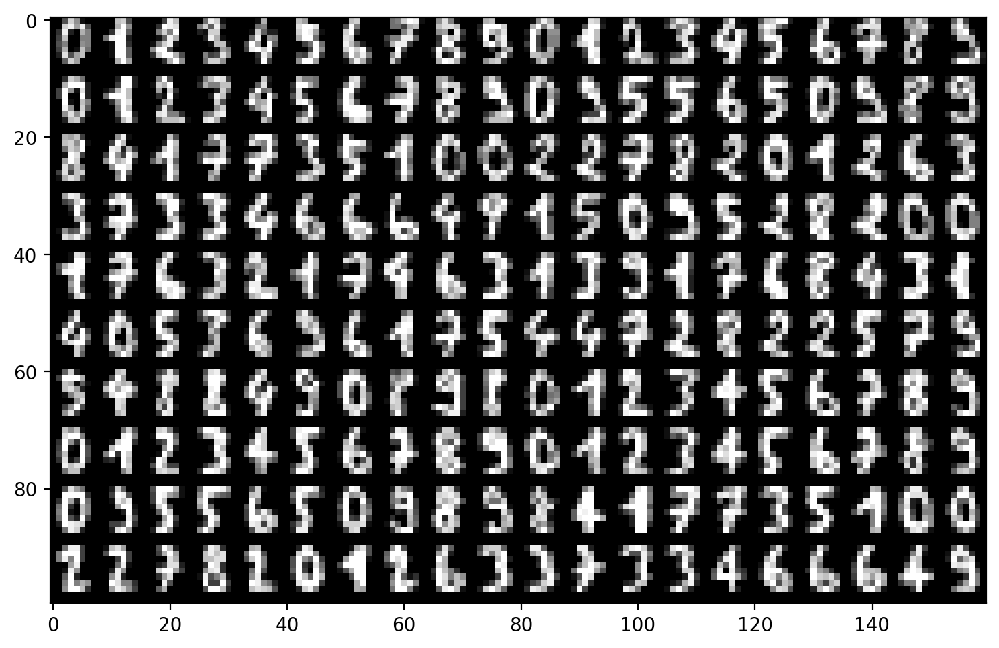

In [16]:
digitfig

- Apply KPCA with RBF kernel
  - (parallelize with `n_jobs`)

In [17]:
kpca = decomposition.KernelPCA(n_components=10, kernel='rbf', gamma=0.001, n_jobs=-1)
trainW = kpca.fit_transform(trainX)

In [18]:
def plot_kbasis(model, imgsize, X):
    KK = model.n_components
    alphas = model.eigenvectors_.T
    minmax = 5
    
    py = KK
    px = minmax*2
    for i in range(KK):
        # sort alphas
        inds = argsort(alphas[i,:])

        myi = r_[arange(-1,-minmax-1,-1), arange(minmax-1,-1,-1)]
        myinds = inds[myi]
        
        for j,jj in enumerate(myinds):
            plt.subplot(py,px,(j+1)+i*px)
            plt.imshow(X[jj,:].reshape(imgsize), interpolation='nearest')
            plt.gray()
            if alphas[i,jj]<0:
                mycol = 'b'
            else:
                mycol = 'r'
            plt.title("{:.3f}".format(alphas[i,jj],), fontsize=7, color=mycol)
            if (j==0):
                plt.ylabel('PC' + str(i+1))
            plt.xticks([])
            plt.yticks([])

- Top-5 positive and negative prototypes for each PC
  - the number is the $a_i$ value for that image.
  - from the prototypes, the PCs are modeling the differences in appearance between digits

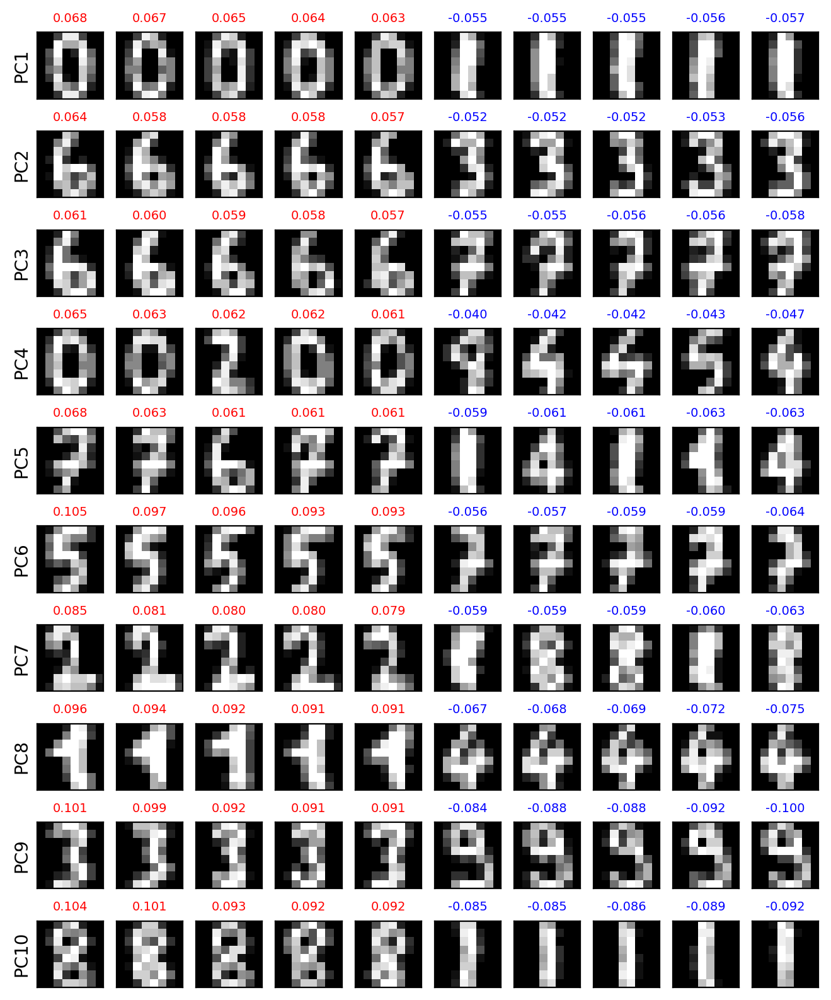

In [19]:
plt.figure(figsize=(8,10))
plot_kbasis(kpca, (8,8), trainX)

# Classification experiment
- use KPCA coefficients as the new representation
  - train a logistic regression classifier
  - try different numbers of components
    - Note: can do this efficiently by selecting a subset of KPCA components.

In [20]:
# apply kernel PCA
kpca = decomposition.KernelPCA(n_components=60, kernel='rbf', gamma=0.001, n_jobs=-1)
trainW = kpca.fit_transform(trainX)
testW = kpca.transform(testX)

In [21]:
ncs = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
accs = []
for nc in ncs: 
    # extract the first nc PCs
    trainWnew = trainW[:,0:nc]
    testWnew  = testW[:,0:nc]
    
    # train classifier
    logreg = linear_model.LogisticRegressionCV(Cs=logspace(-4,4,10), cv=5, n_jobs=-1, max_iter=5000)
    logreg.fit(trainWnew, trainY)

    # test classifier
    predYtest  = logreg.predict(testWnew)
    acc        = metrics.accuracy_score(testY, predYtest)
    accs.append(acc)

In [22]:
# baseline linear classifier on raw image
logreg2 = linear_model.LogisticRegressionCV(Cs=logspace(-4,4,10), cv=5, n_jobs=-1, max_iter=5000)
logreg2.fit(trainX, trainY)
predYtest  = logreg2.predict(testX)
acc_raw    = metrics.accuracy_score(testY, predYtest)

In [23]:
# baseline linear classifier using PCA
pca = decomposition.PCA(n_components=60)
trainW = pca.fit_transform(trainX)
testW  = pca.transform(testX)

accs_pca = []
for nc in ncs: 
    # extract the first nc PCs
    trainWnew = trainW[:,0:nc]
    testWnew  = testW[:,0:nc]
    
    # train classifier
    logreg = linear_model.LogisticRegressionCV(Cs=logspace(-4,4,10), cv=5, n_jobs=-1, max_iter=5000)
    logreg.fit(trainWnew, trainY)

    # test classifier
    predYtest  = logreg.predict(testWnew)
    acc        = metrics.accuracy_score(testY, predYtest)
    accs_pca.append(acc)

- Classification results on test set
  - KPCA can improve the performance, compared with PCA and raw image.

In [24]:
# make a plot
kfig = plt.figure(figsize=(6,4))
plt.plot(ncs, accs, 'bo-', label='KPCA+LR')
plt.plot(ncs, accs_pca, 'rs-', label='PCA+LR')
plt.plot([min(ncs), max(ncs)], [acc_raw, acc_raw], 'm--', label='Image+LR')
plt.legend(loc="best")
plt.xlabel('number of components')
plt.ylabel('test accuracy')
plt.grid(True)
plt.close()

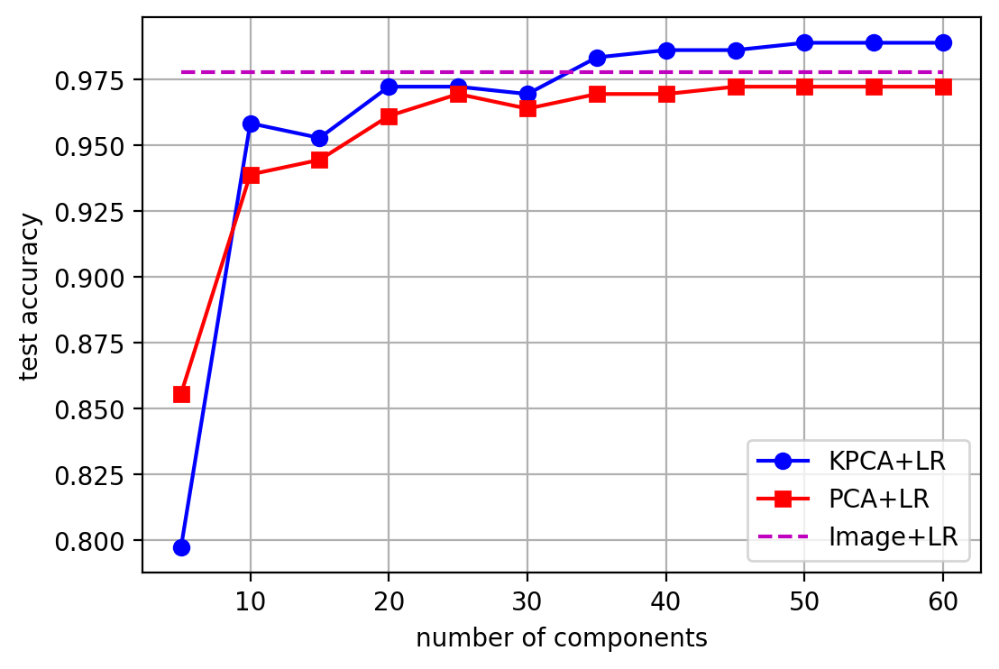

In [25]:
kfig

# KPCA Summary
- Use kernel trick to perform PCA in high-dimensional space.
  - Coefficients are based on a non-linear projection of the data.
  - The type of projection is based on the kernel function selected.
- Using RBF kernel, KPCA can split the data into clusters.

# Outline
1. Linear Dimensionality Reduction for Vectors
2. Linear Dimensionality Reduction for Text
3. Non-linear Dimensionality Reduction
4. **Manifold Embedding**

# Manifold Embedding
- Reduce high-dimensional data to 2 or 3 dimensions for visualization
- Try to preserve the inherent structure of the data
  - find a set of lower-dim points that optimize some criteria.
- Two types:
  - 1) preserve local neighborhood structure
    - assumes thata lies in a lower-dim manifold; unfold the manifold
  - 2) preserve pairwise distances (similarities) between points
<img src="imgs/manifold.jpg" width=450>

# Locally-linear Embedding (LLE)
- **Idea:** preserve linearity within local neighborhoods defined by $K$ nearest neighbors.
  - 1) a point $\mathbf{x}_i$ can be reconstructed by a linear combination of its neighbors $N_i$.
    - find the weights for the best reconstruction
      - $W^* = \mathop{\mathrm{argmin}}_W \sum_i \|\mathbf{x}_i - \sum_{j\in N_i}w_{i,j}\mathbf{x}_j\|^2$
  - 2) the embedded point $\mathbf{y}_i$ should also have the same local linearity.
    - find the embedded points that best preserve the linearity
      - $Y^* = \mathop{\mathrm{argmin}}_Y \sum_i \| \mathbf{y}_i - \sum_{j\in N_i}w_{i,j} \mathbf{y}_j\|^2$

# LLE
<center>
<img src="imgs/lle.jpg" width=500>
</center>

In [26]:
def plot_manifolds(X, Y, Xrs, titles=None, spwidth=2, markersize=None, edgecolors='k'):
# X - original points
# Y - colors
# Xrs - manifold points (list of manifolds)
    numX = len(Xrs)

    if titles==None:
        titles = []
        for i in range(numX):
            titles.append("manifold" + str(i+1)) 
    
    sx = spwidth
    sy = ceil((numX+1)/float(spwidth))
    
    kwargs = {}
    if markersize is not None:
        kwargs['s'] = markersize
        
    fig = plt.gcf()
    
    ax = fig.add_subplot(int(100*sy+10*sx+1), projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=Y, cmap=plt.cm.Spectral, edgecolors=edgecolors, **kwargs)
    ax.view_init(15, -80)
    ax.set_title("Original data")
    
    for i in range(numX):   
        Xr = Xrs[i]
        ax = fig.add_subplot(int(100*sy+10*sx+i+2))
        ax.scatter(Xr[:, 0], Xr[:, 1], c=Y, cmap=plt.cm.Spectral, edgecolors=edgecolors, **kwargs)
        plt.title(titles[i]); plt.grid()

In [27]:
Xswiss, Yswiss = datasets.make_swiss_roll(n_samples=1500, random_state=111)
X = Xswiss
Y = Yswiss

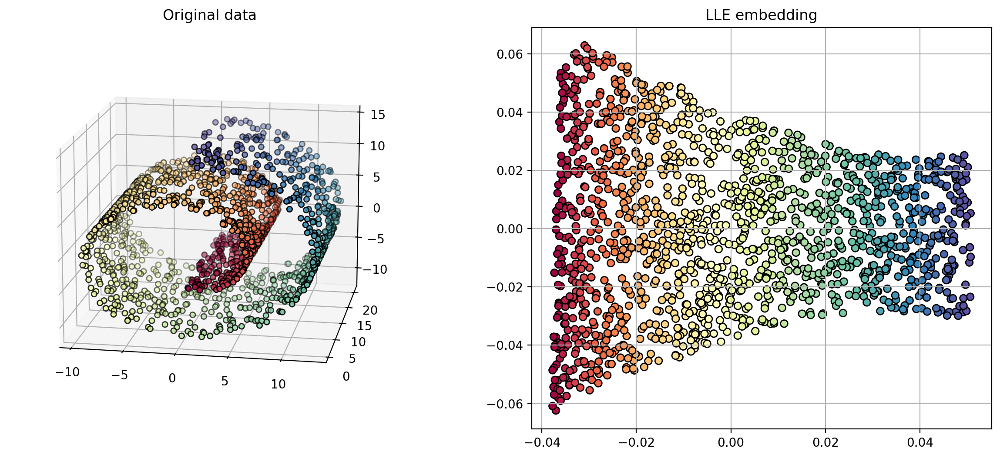

In [28]:
# n_neighbors = number of nearest neighbors to use for local neighborhood
# n_components = number of dimensions of manifold embedding
lle = manifold.LocallyLinearEmbedding(n_neighbors=12, n_components=2, random_state=121, n_jobs=-1)
Xr = lle.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["LLE embedding"])

In [29]:
Xr_all = []
titles_all = []
Xr_all.append(Xr)
titles_all.append("LLE")

- Sensitive to the number of neighbors for defining the local region.

In [30]:
Xrs = []
titles = []
for i,nn in enumerate([5, 10, 15, 50, 100]):
    lle = manifold.LocallyLinearEmbedding(n_neighbors=nn, n_components=2, random_state=121, n_jobs=-1)
    Xr = lle.fit_transform(X)
    Xrs.append(Xr)
    titles.append("LLE (nn=%d)" % (nn,))

lfig = plt.figure(figsize=(14,7))
plot_manifolds(X, Y, Xrs, titles, spwidth=3, markersize=20, edgecolors=[0.2, 0.2, 0.2])
plt.close()

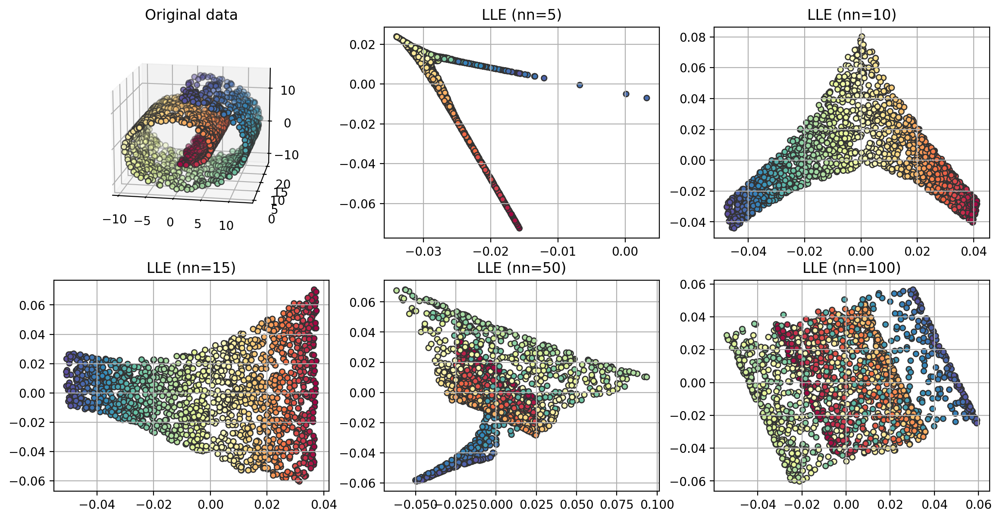

In [31]:
lfig

# Variants of LLE
- **Hessian LLE (HLLE)**: LLE that also uses local curvature information

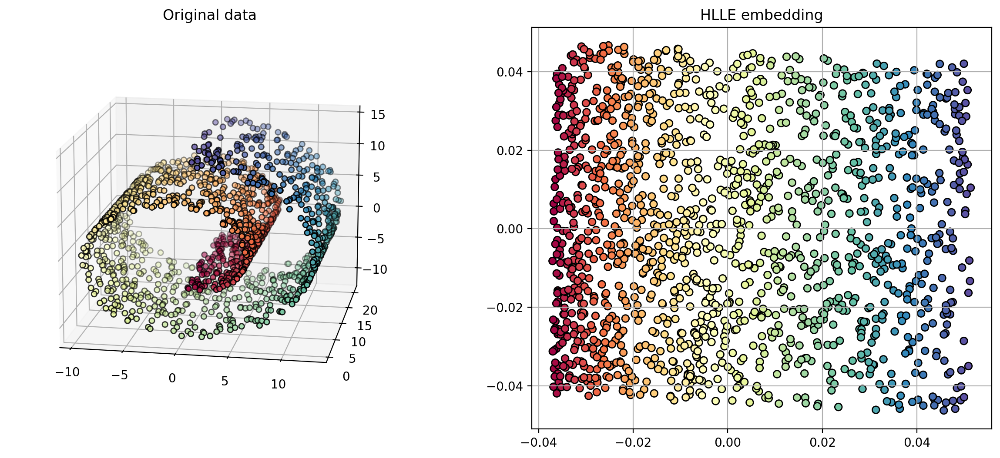

In [32]:
# set method to 'hessian'
hlle = manifold.LocallyLinearEmbedding(method='hessian', n_neighbors=12, n_components=2, random_state=121, n_jobs=-1)
Xr = hlle.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["HLLE embedding"])

In [33]:
Xr_all.append(Xr)
titles_all.append("HLLE")

- **Local tangent space alignment (LTSA)**: rather than preserve distances, align local tangent spaces of the neighborhoods.

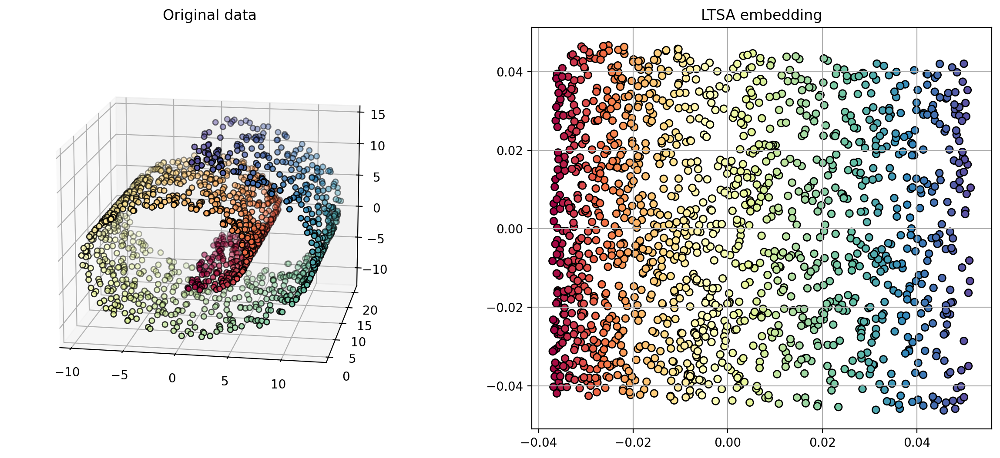

In [34]:
# set method to 'ltsa'
ltsa = manifold.LocallyLinearEmbedding(method='ltsa', n_neighbors=12, n_components=2, random_state=121, n_jobs=-1)
Xr = ltsa.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["LTSA embedding"])

In [35]:
Xr_all.append(Xr)
titles_all.append("LTSA")

# Multidimensional Scaling
- **Idea:** find a low-dimensional embedding that preserves the pairwise distances between points in original high-dim space.
  - $Y^* = \mathop{\mathrm{argmin}}_Y \sum_{i,j} (d(\mathbf{x}_i,\mathbf{x}_j) - d(\mathbf{y}_i,\mathbf{y}_j)))^2$
    - $\mathbf{x}_i$ are points in original space
    - $\mathbf{y}_i$ are points in the embedding space

/Users/zzs/miniconda3/envs/cs5489/lib/python3.12/site-packages/sklearn/manifold/_mds.py:677: FutureWarning: The default value of `n_init` will change from 4 to 1 in 1.9.
  warnings.warn(


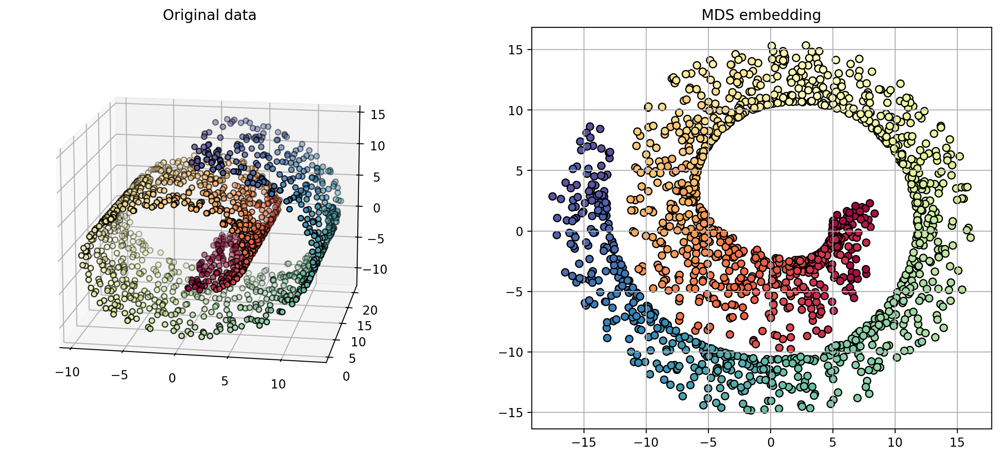

In [36]:
mds = manifold.MDS(n_components=2, random_state=1234, n_jobs=-1)
Xr = mds.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["MDS embedding"])

- **Problem**
  - MDS tries to preserve the Euclidean distance between the points.
  - For a manifold, two points may be far away along the manifold (geodesic distance), but close in Euclidean distance.
    - dashed line = Euclidean distance
    - solid line = Geodesic distance
<center><img src="imgs/geod.png" width=500></center>

# Isomap (Isometric Mapping)
- Find embedding that preserves geodesic distances between points
  - geodesic distance = distances moving on the manifold (figure **A**)
<center><img src="imgs/isomap1.png"></center>

- Approximate manifold by forming a graph (figure **B**)
  - each data point is a node
  - edge is added between nodes if they are $K$-nearest-neighbors.
  - calculate geodesic distance between 2 points using shortest-paths algorithm (Dijkstra’s algorithm).
<center><img src="imgs/isomap1.png"></center>

- Use MDS on the geodesic distances to calculate the embedding (figure **C**).
<center><img src="imgs/isomap1.png"></center>

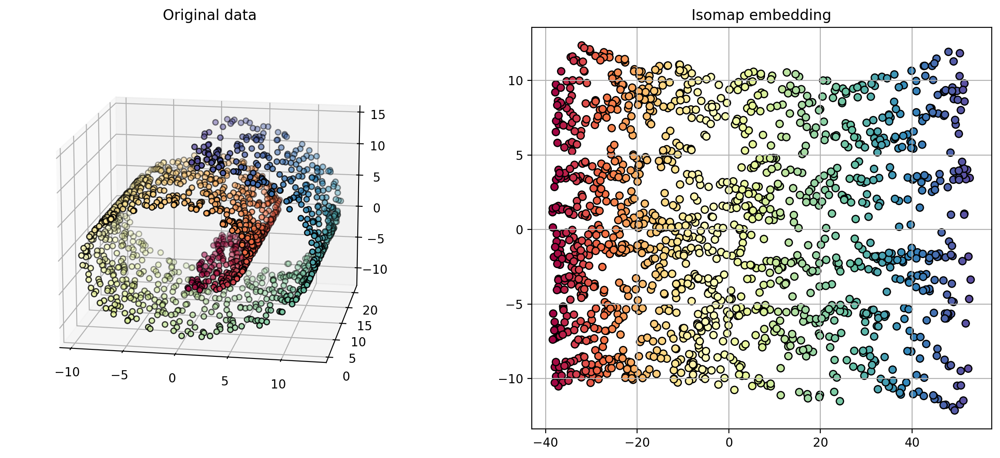

In [37]:
iso = manifold.Isomap(n_neighbors=12, n_components=2, n_jobs=-1)
Xr = iso.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["Isomap embedding"])

In [38]:
Xr_all.append(Xr)
titles_all.append("Isomap")

- Sensitive to number of neighbors
  - too few neighbors will put "holes" in the manifold

In [39]:
Xrs = []
titles = []
for i,nn in enumerate([5, 10, 15]):
    iso = manifold.Isomap(n_neighbors=nn, n_components=2, n_jobs=-1)
    Xr = iso.fit_transform(X)
    Xrs.append(Xr)
    titles.append("Isomap (nn=%d)" % (nn,))

ifig = plt.figure(figsize=(11,7))
plot_manifolds(X, Y, Xrs, titles, markersize=20, edgecolors=[0.2, 0.2, 0.2])
plt.close()

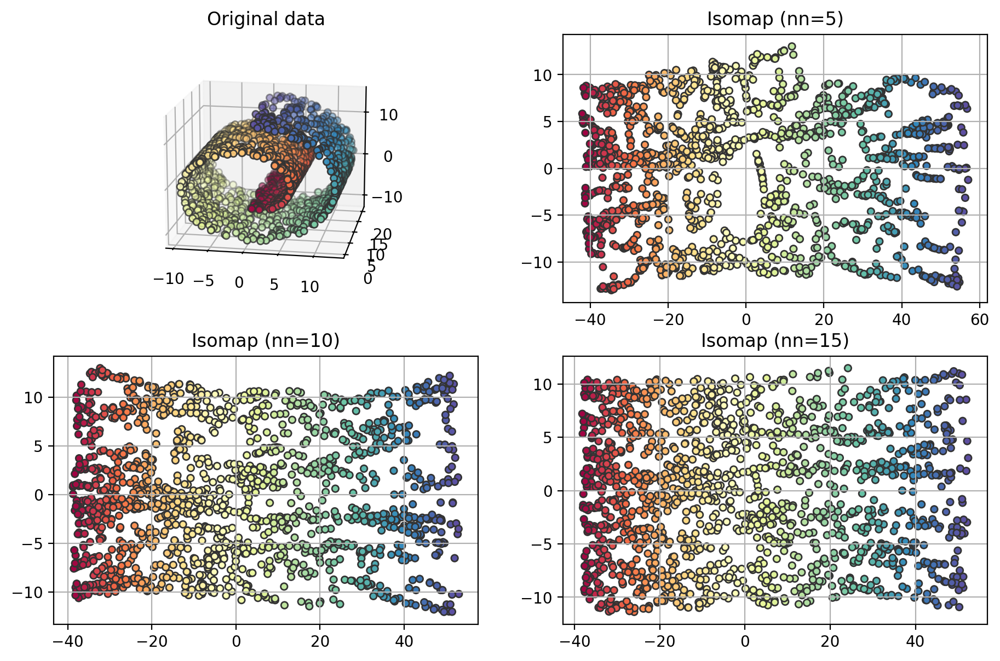

In [40]:
ifig

# Spectral Embedding (Laplacian Eigenmaps)
- Preserve the neighborhood structure
  - 1) form an affinity (adjacency) matrix $W$
    - using $K$ nearest neighbors
      - $W_{i,j} = \begin{cases} 1, & \text{$\mathbf{x}_i$ and $\mathbf{x}_j$ are neighbors} \\ 0, & \text{they are not neighbors}\end{cases}$.
    - using RBF kernel
      - $k(\mathbf{x}_i, \mathbf{x}_j)$ represents how close a neighbor.
  - 2) keep neighboring points close together in the embedding.
    - higher weight $W_{i,j}$ on points that are close together in original space.
      - $Y^* = \mathop{\mathrm{argmin}}_Y \sum_{i,j} W_{i,j} (y_i - y_j)^2$

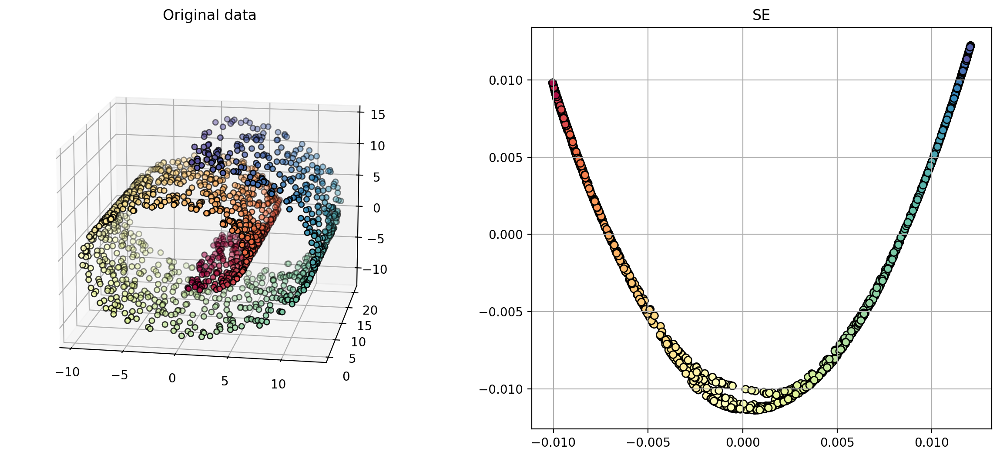

In [41]:
# using nearest-neighbors for affinity
spe = manifold.SpectralEmbedding(n_components=2, affinity='nearest_neighbors', 
                                 random_state=1234, n_neighbors=12, n_jobs=-1)
Xr = spe.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["SE"])

In [42]:
Xr_all.append(Xr)
titles_all.append("SE")

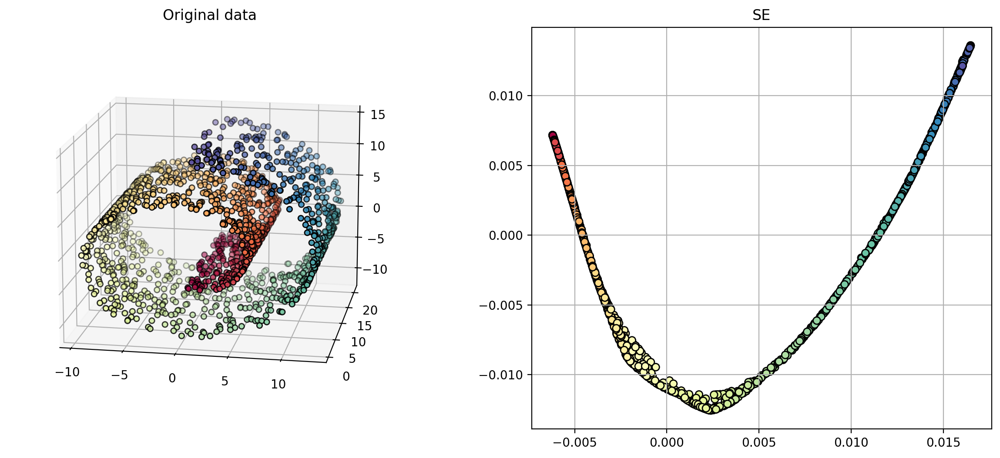

In [43]:
# using RBF kernel for affinity
# gamma is the inverse bandwidth
spe = manifold.SpectralEmbedding(n_components=2, affinity='rbf', 
                                 gamma=0.2, random_state=1234)
Xr = spe.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["SE"])

In [44]:
Xr_all.append(Xr)
titles_all.append("MDS")

# t-Distributed Stochastic Neighbor Embedding (t-SNE)
- Preserve pairwise similarities
  - 1) treat similarities in original space as probabilities
    - the probability that $j$ is a neighbor of $i$: $p_{j|i} = \frac{k_i(\mathbf{x}_i,\mathbf{x_j})}{\sum_{k\neq i} k_i(\mathbf{x}_i, \mathbf{x}_k)}$
      - $k_i(\mathbf{x}_i,\mathbf{x}_j)$ is the RBF kernel with inverse bandwidth $\gamma_i$.
    - the similarity between $i$ and $j$: $p_{i,j} = \frac{p_{j|i} + p_{i|j}}{2N}$
  - 2) similarities in the embedding space (student-t distribution)
    - the probability that $i$ and $j$ are neighbors: $q_{i,j} = \frac{(1 + \|\mathbf{y}_i - \mathbf{y_j}\|^2)^{-1}}{\sum_{k\neq l}(1 + \|\mathbf{y}_l - \mathbf{y_k}\|^2)^{-1}}$
  - 3) find the embedding points that preserve the probability structure:
    - $Y = \mathop{\mathrm{argmin}}_Y \sum_{i\neq j} p_{i,j} \log \frac{p_{i,j}}{q_{i,j}}$
    - the objective is the Kullback-Leibler (KL) divergence, which is a measure of similarity between two probability distributions.

- Tends to group together similar items
  - student-t distribution is heavy-tailed
  - "moderate" distances in original space are converted to "large" distances in embedding space

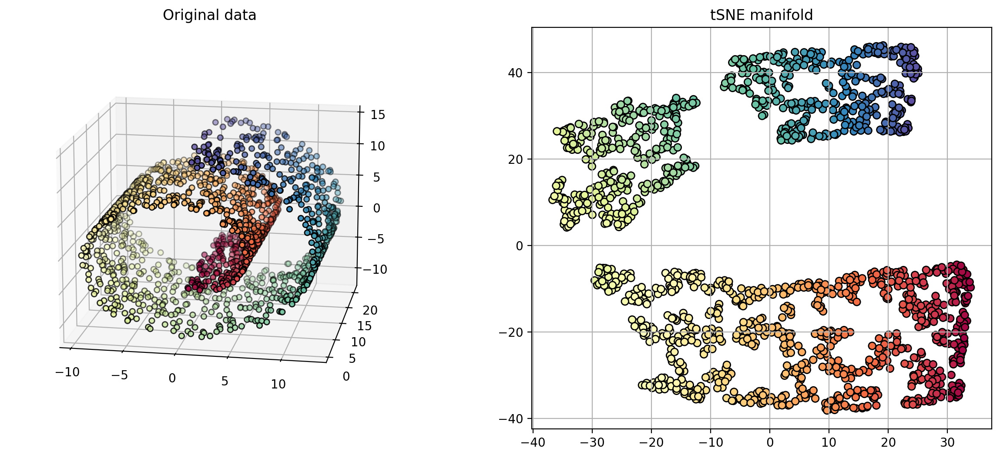

In [45]:
# perplexity = similar to number of neighbors
tsne = manifold.TSNE(n_components=2, perplexity=30.0, random_state=11)
Xr = tsne.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["tSNE manifold"])

In [46]:
Xr_all.append(Xr)
titles_all.append("tSNE")

- The `perplexity` parameter controls the number of groups (size of groups).
  - small perplexity: form more groups
  - large perplexity: form less groups

In [47]:
Xrs = []
titles = []
# perplexity = similar to number of neighbors
for p in [5, 15, 30, 60, 100]:
    tsne = manifold.TSNE(n_components=2, perplexity=p, random_state=11)
    Xr = tsne.fit_transform(X)

    Xrs.append(Xr)
    titles.append('perplexity=%g' % p)
    
tsnefig = plt.figure(figsize=(14,7))
plot_manifolds(X, Y, Xrs, titles, spwidth=3, markersize=20, edgecolors=[0.2, 0.2, 0.2])
plt.close()

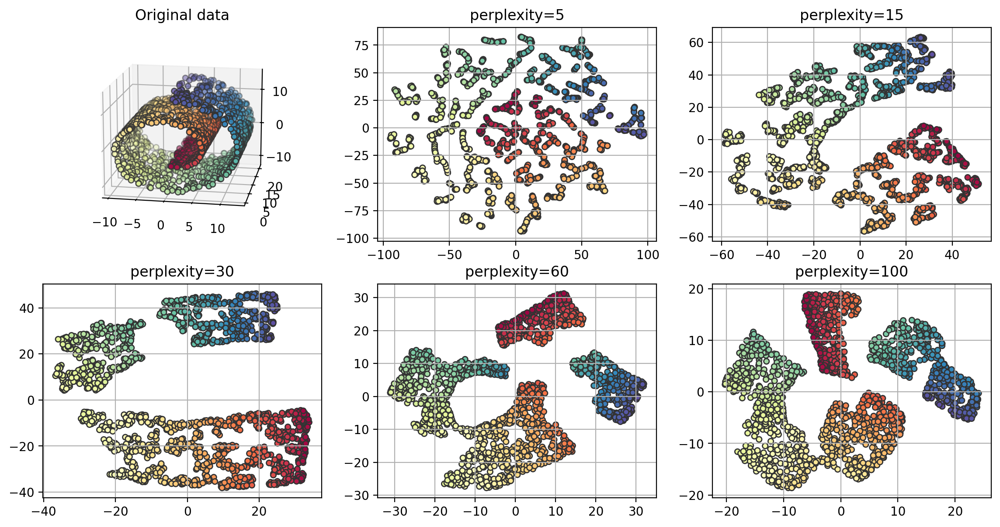

In [48]:
tsnefig

# Comparison of Methods
- Preserves local neighborhoods: LLE, HLLE, TLSA
- Preserves geodesic distance: Isomap, SE
- Preserves distances/similarities: MDS, t-SNE

In [49]:
fig = plt.figure(figsize=(18,7))
plot_manifolds(X, Y, Xr_all, titles_all, spwidth=4, markersize=20, edgecolors=[0.2, 0.2, 0.2])
plt.close()

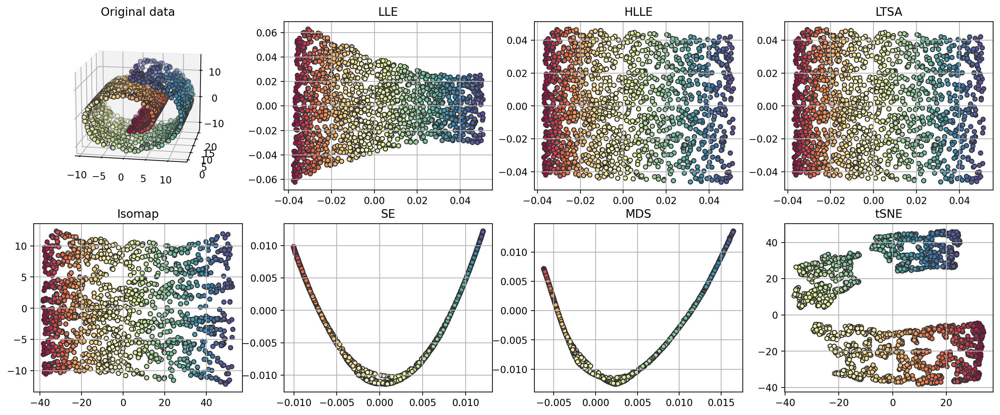

In [50]:
fig

# Digit Images
- Digits 0-5
- Embed 8x8 image (64D vector) into 2-dimensional space for visualization

In [51]:
digits = datasets.load_digits(n_class=6)
X = digits.data
y = digits.target
n_samples, n_features = X.shape
n_neighbors = 30

X_pca = decomposition.PCA(n_components=2).fit_transform(X)
X_iso = manifold.Isomap(n_neighbors=n_neighbors, n_components=2, n_jobs=-1).fit_transform(X)
X_mds = manifold.MDS(n_components=2, n_init=1, max_iter=100, n_jobs=-1).fit_transform(X)
X_se = manifold.SpectralEmbedding(n_components=2, random_state=0, eigen_solver="arpack", n_jobs=-1).fit_transform(X)
X_tsne = manifold.TSNE(n_components=2, init='pca', random_state=0).fit_transform(X)

In [52]:
X_lle = manifold.LocallyLinearEmbedding(n_neighbors=30, n_components=2, n_jobs=-1).fit_transform(X)
#X_hlle = manifold.LocallyLinearEmbedding(n_neighbors, n_components=2, method='hessian').fit_transform(X)
#X_ltsa = manifold.LocallyLinearEmbedding(n_neighbors, n_components=2, method='ltsa').fit_transform(X)

In [53]:
def plot_embedding(X, y, title=None):
    x_min, x_max = amin(X, 0), amax(X, 0)
    X = (X - x_min) / (x_max - x_min)
    ax = plt.gca()
    for i in range(X.shape[0]):
        plt.text(X[i, 0], X[i, 1], str(digits.target[i]),
                 color=plt.cm.Set1(y[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 7})

    if hasattr(matplotlib.offsetbox, 'AnnotationBbox'):
        # only print thumbnails with matplotlib > 1.0
        shown_images = array([[1., 1.]])  # just something big
        for i in range(digits.data.shape[0]):
            dist = sum((X[i] - shown_images) ** 2, 1)
            if min(dist) < 4e-3:
                # don't show points that are too close
                continue
            shown_images = r_[shown_images, [X[i]]]
            imagebox = matplotlib.offsetbox.AnnotationBbox(
                matplotlib.offsetbox.OffsetImage(digits.images[i], 
                    zoom=2., 
                    cmap=plt.cm.gray_r), X[i], pad=0.02)
            imagebox.patch.set_edgecolor(plt.cm.Set1(y[i] / 10.))
            imagebox.patch.set_linewidth(2)
            ax.add_artist(imagebox)
    plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title)

Xall = [X_pca, X_lle, X_mds, X_iso, X_se, X_tsne]
titlesall = ["PCA", "LLE", "MDS", "Isomap", "SE", "tSNE"]
dfig = []
for i,XX in enumerate(Xall):
    if i % 2 == 0:
        dfig.append( plt.figure(figsize=(18,7)) )
    plt.subplot(1,2,i % 2 + 1)
    plot_embedding(XX, y, titlesall[i])
    if i % 2 == 1:
        plt.close()


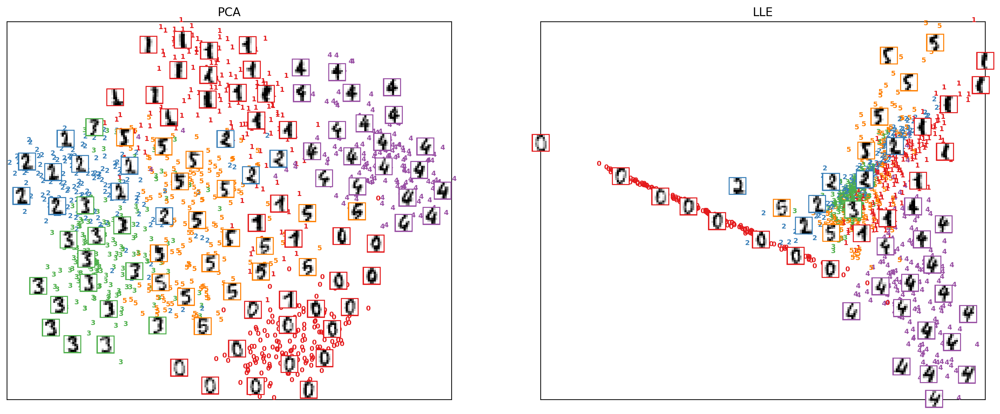

In [54]:
dfig[0]

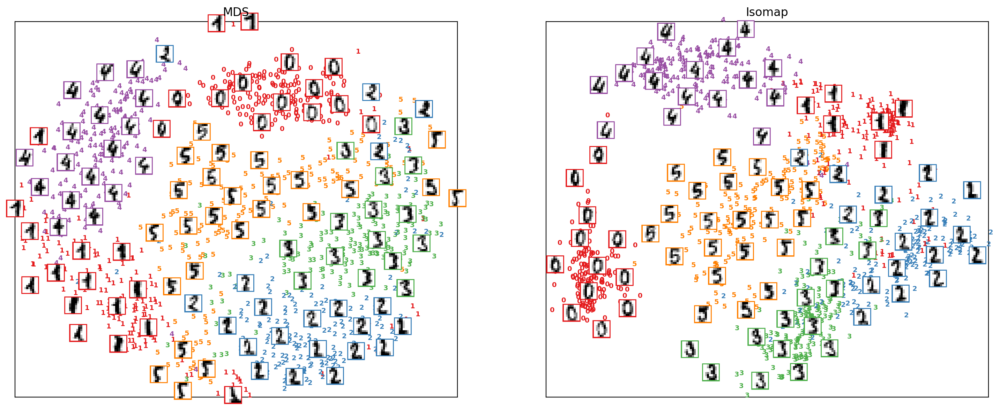

In [55]:
dfig[1]

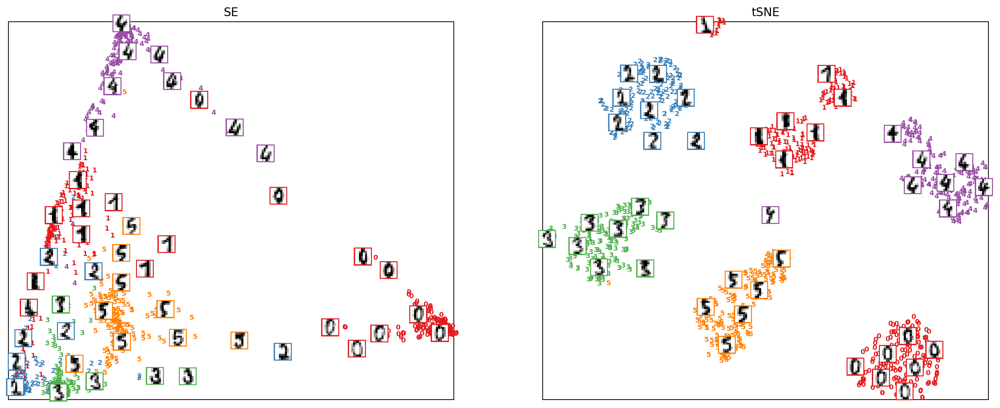

In [56]:
dfig[2]

# Non-Linear Dimensionality Reduction - Summary
- **Goal:** given high-dim data, find a low-dim representation.
  - try to preserve inherent structure of data
- Two types of approaches:
  - _Non-linear dimensionality reduction_
    - calculate low-dim coefficients using non-linear projections (kernel).
    - learn mapping from input space to low-dim space.
  - _Manifold embedding_
    - Optimize over the embedding (low-dim) points to preserve some property from the high-dim points.
    - After training, manifold embedding methods cannot transform a novel (new) point.
      - need to re-train the whole thing.



<table style="font-size:9pt;">
<tr>
<th>Name</th>
<th>Objective</th>
<th>Advantages</th>
<th>Disadvantages</th>
</tr>
<tr>
<td>Kernel principal component analysis (KPCA)</td>
<td>PCA in high-dim feature space (kernel trick)</td>
<td>- can transform novel data</td>
<td>- need to calculate kernel matrix;<br>- need to keep training data around for embedding new points.</td>
</tr>
<tr>
<td>Locally-Linear Embedding (LLE)</td>
<td>preserve local neighborhood distances</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Hessian LLE</td>
<td>w/ local curvature information.</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Local tangent space alignment (LTSA)</td>
<td>align tangent spaces</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Multi-dimensional scaling (MDS)</td>
<td>preserve pairwise distances</td>
<td>- good for viewing the space.</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Isometric mapping (Isomap)</td>
<td>preserve geodesic distances</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Spectral embedding (SE)</td>
<td>"PCA" on graph representation</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>t-distributed Stochastic Neighbor Embedding (t-SNE)</td>
<td>preserve pairwise similarities</td>
<td>- can discover similar items</td>
<td>- cannot embed a novel point.</td>
</tr>
</table>